## ECGR 5106 - HW # 4



In [1]:
# Installing the d2l Module and ptflops
!pip install d2l==1.0.0a1.post0
!pip install ptflops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.0/93.0 KB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.9/120.9 KB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 KB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 22.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for ptflops: filename=ptflops-0.6.9-py3-none-any.whl size=11711 sha256=978aa2875ac2f30a4522907171314e216a8838f9f95ea9ad62c73c24b6db38e0
  Stored in directory: /root/.cache/pip/wheels/86/07/9f/879035d99d7b639bbc564d23fed862a679aee7d1a2dced8c2e
Successfully built ptflops


In [2]:
# Importing all the Necessary Libraries

%matplotlib inline
import math
import pandas as pd
import numpy as np
import ptflops

import matplotlib.pyplot as plt
import torch
import time
import torchvision
import torch.nn.functional as F   
from torchvision import transforms
from d2l import torch as d2l
from torch import nn
import torchvision.models as models
from ptflops import get_model_complexity_info

import torch
torch.__version__
torch.cuda.current_device()
torch.cuda.get_device_name(0)

d2l.use_svg_display()

# Code Snippet to Ignore Warning
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Getting Data from "The Time Machine" Dataset
data = d2l.TimeMachine(batch_size=1024, num_steps=32)

## Problem 1

This Problem focuses on the Language model.

1. Using the GRU example, the hyperparameters (fully connected network and the number of hidden states) will be adjusted and their influence on running time, perplexity, training and validation loss. and the output sequence will be anazlyed.

2. Using the LSTM example, the hyperparameters (fully connected network and the number of hidden states) will be adjusted and their influence on running time, perplexity, training and validation loss. and the output sequence will be anazlyed.

3. Runtime for training and inference, computation and mode size complexities, training and validation loss, and the output sequence for rnn.RNN, rnn.LSTM, and rnn.GRU implementation will be compared with each other while using the same hyperparameters.

## GRU Model

In [4]:
# GRU Model Definition (2 Gates - Reset and Update)
class GRUScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        init_weight = lambda *shape: nn.Parameter(torch.randn(*shape) * sigma)
        triple = lambda: (init_weight(num_inputs, num_hiddens),
                          init_weight(num_hiddens, num_hiddens),
                          nn.Parameter(torch.zeros(num_hiddens)))
        self.W_xz, self.W_hz, self.b_z = triple()  # Update gate
        self.W_xr, self.W_hr, self.b_r = triple()  # Reset gate
        self.W_xh, self.W_hh, self.b_h = triple()  # Candidate hidden state

# Defining the Forward Compution Logic
@d2l.add_to_class(GRUScratch)
def forward(self, inputs, H=None):
    if H is None:
        # Initial state with shape: (batch_size, num_hiddens)
        H = torch.zeros((inputs.shape[1], self.num_hiddens),
                      device=inputs.device)
    outputs = []
    for X in inputs:
        Z = torch.sigmoid(torch.matmul(X, self.W_xz) +
                        torch.matmul(H, self.W_hz) + self.b_z)
        R = torch.sigmoid(torch.matmul(X, self.W_xr) +
                        torch.matmul(H, self.W_hr) + self.b_r)
        H_tilde = torch.tanh(torch.matmul(X, self.W_xh) +
                           torch.matmul(R * H, self.W_hh) + self.b_h)
        H = Z * H + (1 - Z) * H_tilde
        outputs.append(H)
    return outputs, H

Training Time GRU (32 Hidden States): 63.001952171325684
1st Output Sequence Example: it has the the the the the
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard the the the the the


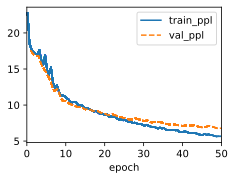

In [ ]:
# Training the GRU Model using RNNLMScratch class 
# 1st Example - With 32 Hidden States
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time GRU (32 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time GRU (8 Hidden States): 65.7877094745636
1st Output Sequence Example: it has the the the the the
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard the the the the the


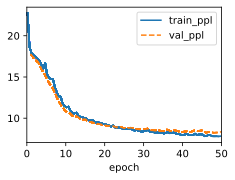

In [ ]:
# Training the GRU Model using RNNLMScratch class 
# 2nd Example - With 8 Hidden States
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=8)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time GRU (8 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time GRU (128 Hidden States): 69.02544641494751
1st Output Sequence Example: it has i the time travelle
2nd Output Sequence Example: proceeded the time traveller a ma
3rd Output Sequence Example: staring hard and the time travel


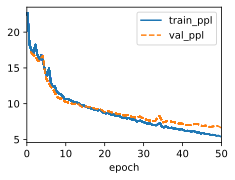

In [ ]:
# Training the GRU Model using RNNLMScratch class 
# 3rd Example - With 128 Hidden States
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time GRU (128 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time GRU (1024 Hidden States): 168.57873249053955
1st Output Sequence Example: it has in the the the the 
2nd Output Sequence Example: proceeded the pracher the the the
3rd Output Sequence Example: staring hard the the the the the


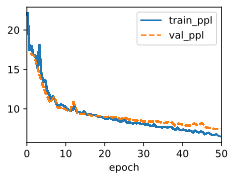

In [ ]:
# Training the GRU Model using RNNLMScratch class 
# 4th Example - With 1024 Hidden States
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=1024)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time GRU (1024 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

## LSTM Model

In [5]:
# LSTM Model Definition (3 Gates - Input, Forget and Output & Input Node)
class LSTMScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        init_weight = lambda *shape: nn.Parameter(torch.randn(*shape) * sigma)
        triple = lambda: (init_weight(num_inputs, num_hiddens),
                          init_weight(num_hiddens, num_hiddens),
                          nn.Parameter(torch.zeros(num_hiddens)))
        self.W_xi, self.W_hi, self.b_i = triple()  # Input gate
        self.W_xf, self.W_hf, self.b_f = triple()  # Forget gate
        self.W_xo, self.W_ho, self.b_o = triple()  # Output gate
        self.W_xc, self.W_hc, self.b_c = triple()  # Input node

# Defining the Forward Computation Logic
@d2l.add_to_class(LSTMScratch)
def forward(self, inputs, H_C=None):
    if H_C is None:
        # Initial state with shape: (batch_size, num_hiddens)
        H = torch.zeros((inputs.shape[1], self.num_hiddens),
                      device=inputs.device)
        C = torch.zeros((inputs.shape[1], self.num_hiddens),
                      device=inputs.device)
    else:
        H, C = H_C
    outputs = []
    for X in inputs:
        I = torch.sigmoid(torch.matmul(X, self.W_xi) +
                        torch.matmul(H, self.W_hi) + self.b_i)
        F = torch.sigmoid(torch.matmul(X, self.W_xf) +
                        torch.matmul(H, self.W_hf) + self.b_f)
        O = torch.sigmoid(torch.matmul(X, self.W_xo) +
                        torch.matmul(H, self.W_ho) + self.b_o)
        C_tilde = torch.tanh(torch.matmul(X, self.W_xc) +
                           torch.matmul(H, self.W_hc) + self.b_c)
        C = F * C + I * C_tilde
        H = O * torch.tanh(C)
        outputs.append(H)
    return outputs, (H, C)

Training Time LSTM (32 Hidden States): 69.16500520706177
1st Output Sequence Example: it has in the the the the 
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard the the the the the


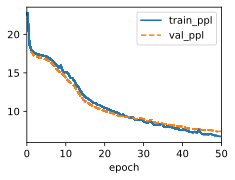

In [ ]:
# Training the LSTM Model using RNNLMScratch class 
# 1st Example - With 32 Hidden States 
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time LSTM (32 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time LSTM (8 Hidden States): 66.05150318145752
1st Output Sequence Example: it has the the the the the
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard the the the the the


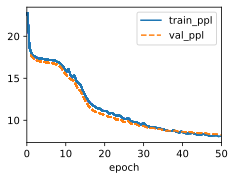

In [ ]:
# Training the LSTM Model using RNNLMScratch class 
# 2nd Example - With 8 Hidden States 
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=8)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time LSTM (8 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time LSTM (128 Hidden States): 77.44745874404907
1st Output Sequence Example: it has the the the the the
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard the the the the the


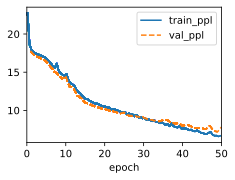

In [ ]:
# Training the LSTM Model using RNNLMScratch class 
# 3rd Example - With 128 Hidden States 
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()


# Printing the Running Time
print("Training Time LSTM (128 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time LSTM (1024 Hidden States): 212.132826089859
1st Output Sequence Example: it has and the the the the
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard the the the the the


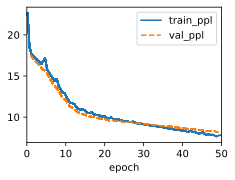

In [ ]:
# Training the LSTM Model using RNNLMScratch class 
# 4th Example - With 1024 Hidden States 
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=1024)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()


# Printing the Running Time
print("Training Time LSTM (1024 Hidden States):", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

## Comparison between rnn.RNN, rnn.LSTM, and rnn.GRU

In [10]:
# Defining the Class RNN
class RNN(d2l.Module): 
    """The RNN model implemented with high-level APIs."""
    def __init__(self, num_inputs, num_hiddens):
        super().__init__()
        self.save_hyperparameters()
        self.rnn = nn.RNN(num_inputs, num_hiddens)

    def forward(self, inputs, H=None):
        return self.rnn(inputs, H)

# Defining the RNNLM Class which defines RNN-based Language Model
class RNNLM(d2l.RNNLMScratch): 
    """The RNN-based language model implemented with high-level APIs."""
    def init_params(self):
        self.linear = nn.LazyLinear(self.vocab_size)

    def output_layer(self, hiddens):
        return self.linear(hiddens).swapaxes(0, 1)

In [11]:
# Training the rnn.RNN Model on Same (Best) HyperParameters as used for GRU and LSTM Models
# Best Models for Both GRU and LSTM was with 128 Hidden States
rnn = RNN(num_inputs=len(data.vocab), num_hiddens=128)
model = RNNLM(rnn, vocab_size=len(data.vocab), lr=1)

Training Time rnn.RNN: 204.93490386009216
1st Output Sequence Example: it has soo exint ally it a
2nd Output Sequence Example: proceeded the preseed and whace t
3rd Output Sequence Example: staring hard an i freller along 


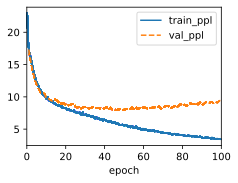

In [8]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time rnn.RNN:", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [12]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(rnn, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

RNN(
  20.22 k, 100.000% Params, 20.84 MMac, 100.000% MACs, 
  (rnn): RNN(20.22 k, 100.000% Params, 20.84 MMac, 100.000% MACs, 28, 128)
)
Computational complexity:       20.84 MMac
Number of parameters:           20.22 k 


In [13]:
# Concise Implementation for rnn.LSTM
class LSTM(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens)

    def forward(self, inputs, H_C=None):
        return self.rnn(inputs, H_C)

In [14]:
# Training the rnn.LSTM Model on Same (Best) HyperParameters as used for GRU and LSTM Models
# Best Models for Both GRU and LSTM was with 128 Hidden States
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=4)

Training Time rnn.LSTM: 207.57151746749878
1st Output Sequence Example: it has frout in and discin
2nd Output Sequence Example: proceeded the time traveller smil
3rd Output Sequence Example: staring hard at a conel one smal


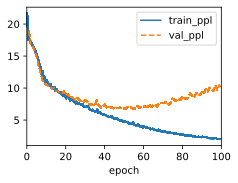

In [10]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time rnn.LSTM:", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [15]:
# Printing the Model Complexity and Total # of Parameters
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(lstm, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  80.9 k, 100.000% Params, 84.15 MMac, 100.000% MACs, 
  (rnn): LSTM(80.9 k, 100.000% Params, 84.15 MMac, 100.000% MACs, 28, 128)
)
Computational complexity:       84.15 MMac
Number of parameters:           80.9 k  


In [16]:
# Concise Implementation for rnn.GRU
class GRU(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.GRU(num_inputs, num_hiddens)

In [17]:
# Training the rnn.GRU Model on Same (Best) HyperParameters as used for GRU and LSTM Models
# Best Models for Both GRU and LSTM was with 128 Hidden States
gru = GRU(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=4)

Training Time rnn.GRU: 189.15448093414307
1st Output Sequence Example: it hass to the the time tr
2nd Output Sequence Example: proceeded the the the the the the
3rd Output Sequence Example: staring hard to the the time tra


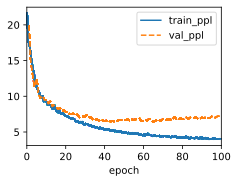

In [12]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0 = time.time()
trainer.fit(model, data)
t1 = time.time()

# Printing the Running Time
print("Training Time rnn.GRU:", t1-t0)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [18]:
# Printing the Model Complexity and Total # of Parameters
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(gru, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  5.95 k, 100.000% Params, 6.32 MMac, 100.000% MACs, 
  (rnn): GRU(5.95 k, 100.000% Params, 6.32 MMac, 100.000% MACs, 28, 32)
)
Computational complexity:       6.32 MMac
Number of parameters:           5.95 k  


## Problem 2

This Problem focuses on the Deep RNN Problem.

1. Model will be built replacing the GRU with an LSTM and the training and validation loss, and the output sequence will be compared.

2. Runtime for training and inference, computation and mode size complexities, and the output strings for nn.LSTM and rnn.GRU implementations will be compared against each other.

3. Adjusting the hyperparameters (fully connected network, number of hidden layers, and the number of hidden states) results (training and validation loss, computation complexity, model size, training and inference time, and the output sequence) will be compared and their influence on accuracy, running time, and computational perplexity will be analyzed.

In [19]:
# Defining the Concise Implementation of Deep GRU Model
class GRU(d2l.RNN):
    """The multi-layer GRU model."""
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.GRU(num_inputs, num_hiddens, num_layers,
                          dropout=dropout)

In [20]:
# Training the Deep GRU Model
gru = GRU(num_inputs=len(data.vocab), num_hiddens=32, num_layers=2)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)

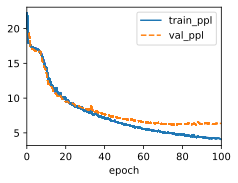

In [14]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0_GRU = time.time()
trainer.fit(model, data)
t1_GRU = time.time()

In [15]:
# Printing the Running Time
print("Training Time Deep GRU:", t1_GRU-t0_GRU)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time Deep GRU: 191.88320302963257
1st Output Sequence Example: it has greel the medical m
2nd Output Sequence Example: proceeded the time traveller dime
3rd Output Sequence Example: staring hard have the time trave


In [21]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(gru, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  12.29 k, 100.000% Params, 13.04 MMac, 100.000% MACs, 
  (rnn): GRU(12.29 k, 100.000% Params, 13.04 MMac, 100.000% MACs, 28, 32, num_layers=2)
)
Computational complexity:       13.04 MMac
Number of parameters:           12.29 k 


In [22]:
# Defining the Concise Implementation of Deep LSTM Model
class LSTM(d2l.RNN):
    """The multi-layer LSTM model."""
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens, num_layers,
                          dropout=dropout)

In [23]:
# Training the Deep LSTM Model
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=32, num_layers=2)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)

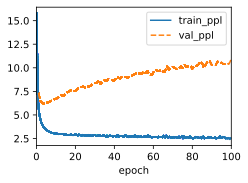

In [20]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0_LSTM = time.time()
trainer.fit(model, data)
t1_LSTM = time.time()

In [21]:
# Printing the Running Time
print("Training Time Deep LSTM:", t1_LSTM-t0_LSTM)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

Training Time Deep LSTM: 192.35123205184937
1st Output Sequence Example: it has his denith bree spe
2nd Output Sequence Example: proceeded the three direction all
3rd Output Sequence Example: staring hard and the time travel


In [24]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(lstm, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  16.38 k, 100.000% Params, 17.43 MMac, 100.000% MACs, 
  (rnn): LSTM(16.38 k, 100.000% Params, 17.43 MMac, 100.000% MACs, 28, 32, num_layers=2)
)
Computational complexity:       17.43 MMac
Number of parameters:           16.38 k 


## Experimentation with Deep GRU Model

In [26]:
# Training the Deep GRU Model with 128 Hidden States
gru = GRU(num_inputs=len(data.vocab), num_hiddens=128, num_layers=2)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)

Training Time Deep GRU (128 Hidden States): 204.67187929153442
1st Output Sequence Example: it has hand a small has a 
2nd Output Sequence Example: proceeded the three and so i neve
3rd Output Sequence Example: staring hard and any of the ball


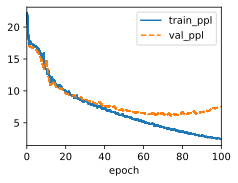

In [24]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0_GRU = time.time()
trainer.fit(model, data)
t1_GRU = time.time()

# Printing the Running Time
print("Training Time Deep GRU (128 Hidden States):", t1_GRU-t0_GRU)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [27]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(gru, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  159.74 k, 100.000% Params, 165.41 MMac, 100.000% MACs, 
  (rnn): GRU(159.74 k, 100.000% Params, 165.41 MMac, 100.000% MACs, 28, 128, num_layers=2)
)
Computational complexity:       165.41 MMac
Number of parameters:           159.74 k


In [29]:
# Training the Deep GRU Model with 8 Hidden Layers
gru = GRU(num_inputs=len(data.vocab), num_hiddens=32, num_layers=8)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)

Training Time Deep GRU (8 Hidden Layers): 201.4326250553131
1st Output Sequence Example: it has                    
2nd Output Sequence Example: proceeded the                    
3rd Output Sequence Example: staring hard                    


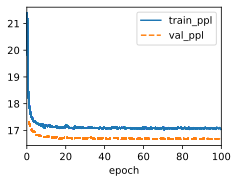

In [25]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0_GRU = time.time()
trainer.fit(model, data)
t1_GRU = time.time()

# Printing the Running Time
print("Training Time Deep GRU (8 Hidden Layers):", t1_GRU-t0_GRU)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [30]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(gru, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  50.3 k, 100.000% Params, 53.35 MMac, 100.000% MACs, 
  (rnn): GRU(50.3 k, 100.000% Params, 53.35 MMac, 100.000% MACs, 28, 32, num_layers=8)
)
Computational complexity:       53.35 MMac
Number of parameters:           50.3 k  


## Experimentation with Deep LSTM Model

In [35]:
# Training the Deep LSTM Model with 128 Hidden States
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=128, num_layers=2)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)

Training Time Deep LSTM (128 Hidden States): 206.8498477935791
1st Output Sequence Example: it has in the time travell
2nd Output Sequence Example: proceeded the time traveller the 
3rd Output Sequence Example: staring hard the time traveller 


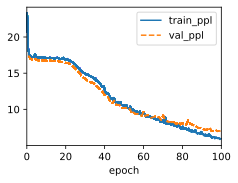

In [36]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0_LSTM = time.time()
trainer.fit(model, data)
t1_LSTM = time.time()

# Printing the Running Time
print("Training Time Deep LSTM (128 Hidden States):", t1_LSTM-t0_LSTM)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [37]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(lstm, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  212.99 k, 100.000% Params, 220.73 MMac, 100.000% MACs, 
  (rnn): LSTM(212.99 k, 100.000% Params, 220.73 MMac, 100.000% MACs, 28, 128, num_layers=2)
)
Computational complexity:       220.73 MMac
Number of parameters:           212.99 k


In [38]:
# Training the Deep LSTM Model with 8 Hidden Layers
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=32, num_layers=8)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)

Training Time Deep LSTM (8 Hidden Layers): 201.3380947113037
1st Output Sequence Example: it has                    
2nd Output Sequence Example: proceeded the                    
3rd Output Sequence Example: staring hard                    


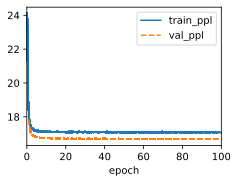

In [39]:
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
t0_LSTM = time.time()
trainer.fit(model, data)
t1_LSTM = time.time()

# Printing the Running Time
print("Training Time Deep LSTM (8 Hidden Layers):", t1_LSTM-t0_LSTM)

# Testing the model with the Multiple Output Sequences
print("1st Output Sequence Example:", model.predict('it has', 20, data.vocab, d2l.try_gpu()))

print("2nd Output Sequence Example:", model.predict('proceeded the', 20, data.vocab, d2l.try_gpu()))

print("3rd Output Sequence Example:", model.predict('staring hard', 20, data.vocab, d2l.try_gpu()))

In [40]:
# Printing the Model Complexity and Total # of Parameters
macs, params = get_model_complexity_info(lstm, (1024, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  67.07 k, 100.000% Params, 71.3 MMac, 100.000% MACs, 
  (rnn): LSTM(67.07 k, 100.000% Params, 71.3 MMac, 100.000% MACs, 28, 32, num_layers=8)
)
Computational complexity:       71.3 MMac
Number of parameters:           67.07 k 
